In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("anshulm257/rice-disease-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/rice-disease-dataset


In [2]:
# EDA TO UNDERSTAND DATASET
# EDA TO ALSO SELECT MODELS BASED ON DATA

In [6]:
import os
import glob
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2

# Define the dataset path
dataset_path = Path('/kaggle/input/rice-disease-dataset/Rice_Leaf_AUG')

# verify the path exists and list classes
if dataset_path.exists():
    classes = [x.name for x in dataset_path.iterdir() if x.is_dir()]
    print(f"Classes found: {classes}")

# Load file paths and labels into a DataFrame
image_paths = []
labels = []

for class_name in classes:
    class_dir = dataset_path / class_name
    for img_path in class_dir.glob('*.*'):
        image_paths.append(str(img_path))
        labels.append(class_name)

df = pd.DataFrame({
    'filepath': image_paths,
    'label': labels
})

print(f"Total images loaded: {len(df)}")
df.head()

Classes found: ['Leaf scald', 'Sheath Blight', 'Healthy Rice Leaf', 'Leaf Blast', 'Brown Spot', 'Bacterial Leaf Blight']
Total images loaded: 3829


,filepath,label
0,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,Leaf scald
1,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,Leaf scald
2,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,Leaf scald
3,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,Leaf scald
4,/kaggle/input/rice-disease-dataset/Rice_Leaf_A...,Leaf scald


label
Healthy Rice Leaf        653
Brown Spot               646
Bacterial Leaf Blight    636
Leaf Blast               634
Sheath Blight            632
Leaf scald               628
Name: count, dtype: int64


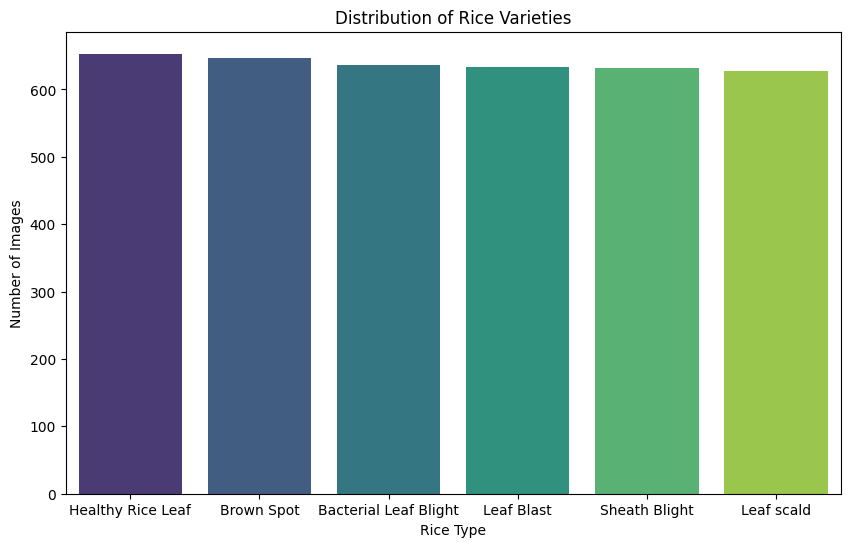

In [7]:
# Check count of images per class
label_counts = df['label'].value_counts()
print(label_counts)

# Visualize the distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
plt.title('Distribution of Rice Varieties')
plt.xlabel('Rice Type')
plt.ylabel('Number of Images')
plt.show()

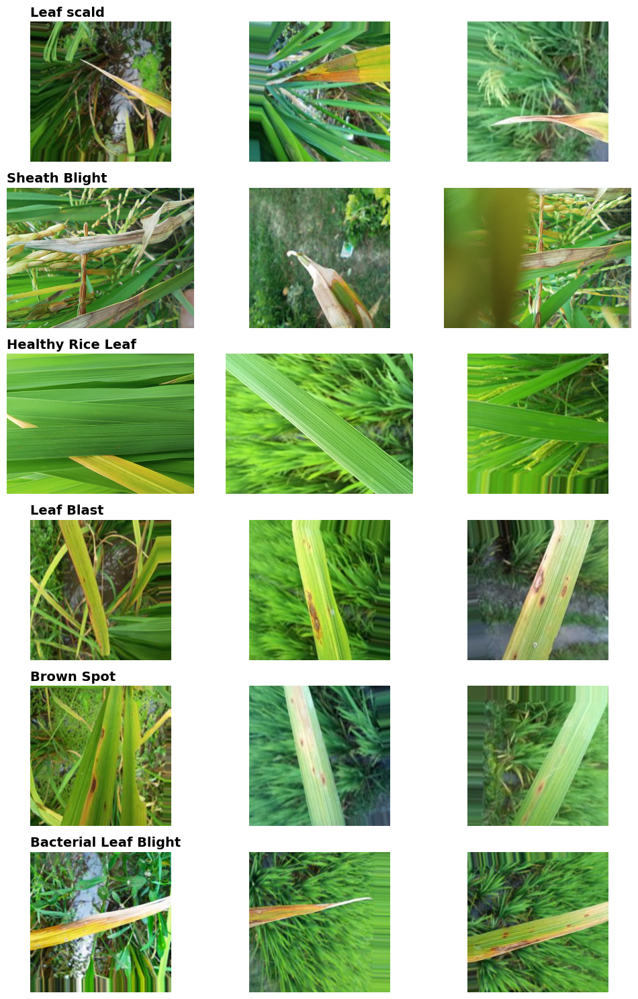

In [8]:
# Visualize the samples
def visualize_samples(df, num_samples=3):
    unique_labels = df['label'].unique()

    fig, axes = plt.subplots(len(unique_labels), num_samples, figsize=(10, 15))

    for i, label in enumerate(unique_labels):
        sample_df = df[df['label'] == label].sample(num_samples)
        for j, (_, row) in enumerate(sample_df.iterrows()):
            img = Image.open(row['filepath'])
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(label, fontsize=14, fontweight='bold', loc='left')

    plt.tight_layout()
    plt.show()

visualize_samples(df)

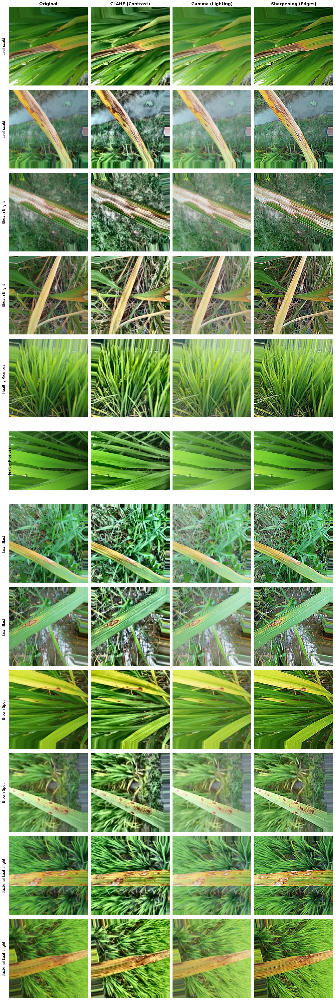

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def apply_gamma(img, gamma=1.2):
    """
    Adjusts brightness to handle shadows/glare in field images.
    Gamma < 1 makes it brighter, Gamma > 1 makes it darker/contrasty.
    """
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

def apply_sharpening(img):
    """
    Enhances the edges of disease spots (lesions).
    """
    # Standard sharpening kernel
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def get_hsv_saturation(img):
    """
    Extracts the Saturation channel.
    Disease spots often differ significantly in saturation compared to healthy green leaves.
    """
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    return cv2.cvtColor(s, cv2.COLOR_GRAY2RGB) 

def visualize_advanced_transforms(df, num_samples=2):
    unique_labels = df['label'].unique()
    cols = 4 
    rows = len(unique_labels) * num_samples
    
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
    clahe_obj = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))

    row_idx = 0
    for label in unique_labels:
        sample_df = df[df['label'] == label].sample(num_samples)
        
        for _, row in sample_df.iterrows():
            # Load and convert to Numpy
            pil_img = Image.open(row['filepath'])
            img_rgb = np.array(pil_img.convert('RGB'))
            
            # 1. CLAHE (on L channel)
            lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
            l, a, b = cv2.split(lab)
            l_clahe = clahe_obj.apply(l)
            img_clahe = cv2.cvtColor(cv2.merge((l_clahe, a, b)), cv2.COLOR_LAB2RGB)
            
            # 2. Gamma Correction
            img_gamma = apply_gamma(img_rgb, gamma=1.5) 
            
            # 3. Sharpening
            img_sharp = apply_sharpening(img_rgb)
            
            # Plotting
            images = [img_rgb, img_clahe, img_gamma, img_sharp]
            titles = ["Original", "CLAHE (Contrast)", "Gamma (Lighting)", "Sharpening (Edges)"]
            
            for col_idx in range(cols):
                axes[row_idx, col_idx].imshow(images[col_idx])
                axes[row_idx, col_idx].axis('off')
                if row_idx == 0:
                    axes[row_idx, col_idx].set_title(titles[col_idx], fontsize=14, fontweight='bold')
                if col_idx == 0:
                    axes[row_idx, col_idx].text(-20, img_rgb.shape[0]//2, label, fontsize=12, rotation=90, verticalalignment='center')

            row_idx += 1

    plt.tight_layout()
    plt.show()

visualize_advanced_transforms(df)

In [9]:
# Check dimensions of a random samples
sample_size = 500
sample_df = df.sample(sample_size, random_state=42)

widths = []
heights = []
channels = []

for img_path in sample_df['filepath']:
    img = cv2.imread(img_path)
    h, w, c = img.shape
    widths.append(w)
    heights.append(h)
    channels.append(c)

print(f"Dimension Analysis (Sample of {sample_size})")
print(f"Unique Widths: {set(widths)}")
print(f"Unique Heights: {set(heights)}")
print(f"Unique Channels: {set(channels)}")
print(f"All images in sample are: {widths[0]}x{heights[0]} with {channels[0]} channels.")

Dimension Analysis (Sample of 500)
Unique Widths: {224, 1600, 455, 427, 1200, 2160, 2448, 1046, 438, 3000}
Unique Heights: {1600, 224, 4000, 3840, 3264, 1322, 1200, 1074, 441, 607}
Unique Channels: {3}
All images in sample are: 1200x1600 with 3 channels.


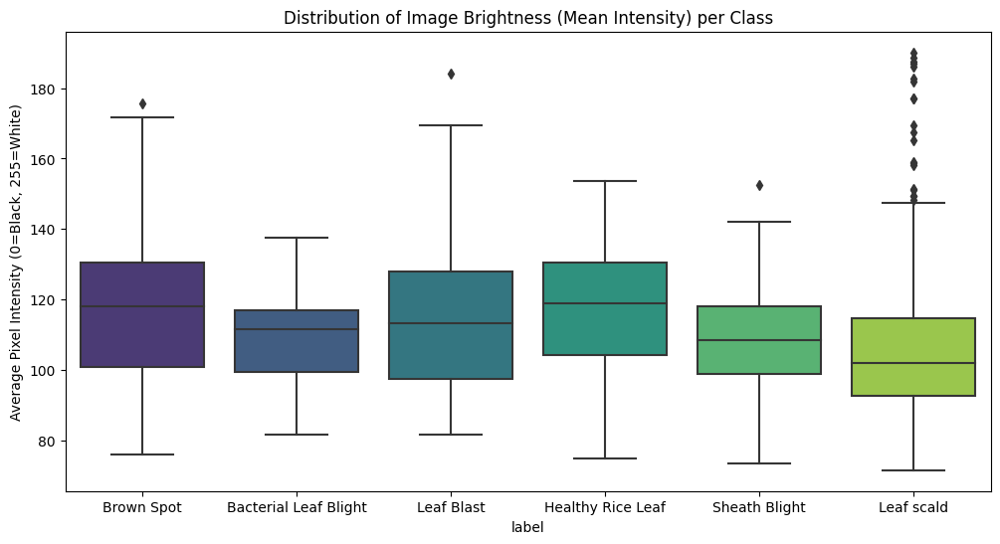

In [10]:
# Pixel Intensity of all classes
def get_mean_intensity(filepath):
    img = cv2.imread(filepath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img.mean()

sample_df = df.sample(1000, random_state=42)
sample_df['mean_intensity'] = sample_df['filepath'].apply(get_mean_intensity)

# Plotting
plt.figure(figsize=(12, 6))
sns.boxplot(x='label', y='mean_intensity', data=sample_df, palette='viridis')
plt.title('Distribution of Image Brightness (Mean Intensity) per Class')
plt.ylabel('Average Pixel Intensity (0=Black, 255=White)')
plt.show()

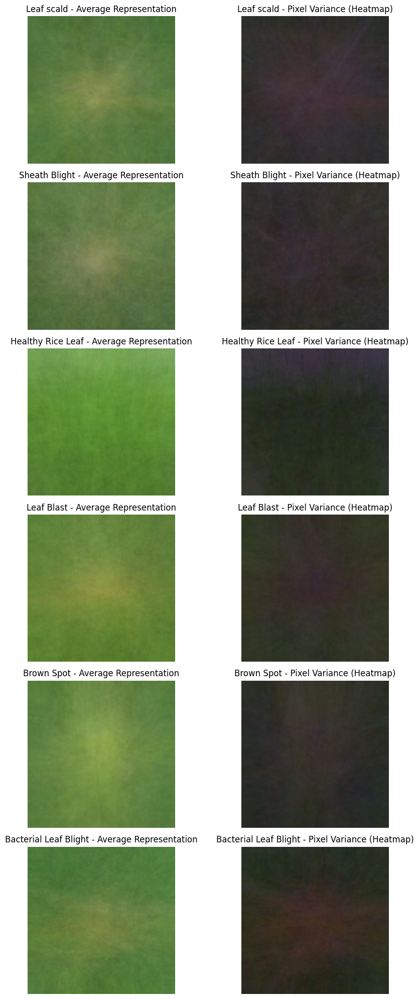

In [11]:
# Variance of all classes
def visualize_class_variance(class_name, df, num_images=100):
    class_paths = df[df['label'] == class_name]['filepath'].sample(num_images, random_state=42).values

    images = []
    target_size = (250, 250)

    for path in class_paths:
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, target_size)
        images.append(img)

    images = np.array(images)

    # Calculate Mean and Standard Deviation
    mean_img = np.mean(images, axis=0).astype(np.uint8)
    std_img = np.std(images, axis=0).astype(np.uint8)

    return mean_img, std_img

# Visualize for all classes
classes = df['label'].unique()
fig, axes = plt.subplots(len(classes), 2, figsize=(10, 20))

for i, class_name in enumerate(classes):
    mean_img, std_img = visualize_class_variance(class_name, df)

    # Plot Mean Image
    axes[i, 0].imshow(mean_img)
    axes[i, 0].set_title(f'{class_name} - Average Representation')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(std_img, cmap='inferno')
    axes[i, 1].set_title(f'{class_name} - Pixel Variance (Heatmap)')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# FINDINGS:
# 1. DATASET IS CLEAN
# 2. HIGH OUTLIERS FOR LEAF SCALD FOR PIXEL INTENSITIES
# 3. MEAN OF EACH CLASSES IS CENTERED AND THE VARIANCE IS ALSO NOT VERY WIDE
# 4. CLAHE GIVES BETTER CONTRAST TO IMAGES. USE IT AS A AUGMENTATION FUNCTION

In [ ]:
# NEXT STEPS:
# 1. FROM THIS, WE CAN SAY THAT THE DATASET DOESNT REQUIRE A VERY COMPLEX MODEL TO TRAIN
# 2. CAN USE EFFICIENT MODELS WITH LESSER WIDTH WHICH ARE EASIER TO QUANTIZE TOO
# 3. STUDENT MODEL : MOBILENET-V3-SMALL-WIDTH-0.50X
# 4. CAN DO KNOWLEDGE DISTILLATION TO MAKE UP FOR THE LOSS DURING QUANTIZATION (QAT). CHOOSE WIDE TEACHERS FOR MORE GENERALIZED LOGITS
# 5. TEACHER MODEL : MOBILENETV2, DENSENET121, RESNET18